In [29]:
import pandas as pd
import sys


sys.path.append('../../')
from src.plot_helpers import plot_experiment_range,plot_correlation_matrix
from src.transform import transform_diff_avg,load_json

ls = load_json("../../json/locations.json")["ls"]

## Load data

In [30]:
df = pd.read_csv('../../data/clean_data/all_sensors.csv',index_col=0,parse_dates=True)
df

/tmp/ipykernel_1906606/2544046345.py:1: DtypeWarning:

Columns (6,26) have mixed types. Specify dtype option on import or set low_memory=False.



,aqi_palas,averaging,cn,co,co2,dcn,formaldehyde,global_error,humidity,indoor_nox_index,...,temperature,tvoc,tvoc_ppb,voc,volume_flow,x10_dcn,x16_dcn,x50_dcn,x84_dcn,x90_dcn
datetime,,,,,,,,,,,,,,,,,,,,,
2024-10-11 13:24:18,NaN,NaN,NaN,NaN,566.00,NaN,3.0,NaN,58.00,NaN,...,20.50,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-10-11 13:33:57,NaN,NaN,NaN,NaN,528.00,NaN,11.0,NaN,58.00,NaN,...,21.00,87.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-10-11 13:43:57,NaN,NaN,NaN,NaN,596.00,NaN,36.0,NaN,57.00,NaN,...,22.20,103.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-10-11 13:44:34,NaN,NaN,NaN,NaN,675.00,NaN,42.0,NaN,57.00,NaN,...,22.70,103.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-10-11 13:54:27,NaN,NaN,NaN,NaN,701.00,NaN,41.0,NaN,57.00,NaN,...,23.00,102.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-10-23 13:31:00,82.00,60.0,910.15,NaN,1047.80,->,NaN,0.0,58.04,NaN,...,23.08,NaN,NaN,6.25,1.0,0.19,0.2,0.24,0.31,0.33
2024-10-23 13:32:00,82.00,60.0,930.16,NaN,1041.80,->,NaN,0.0,58.21,NaN,...,23.09,NaN,NaN,6.21,1.0,0.19,0.2,0.24,0.31,0.33
2024-10-23 13:33:00,82.77,60.0,942.98,NaN,1049.43,->,NaN,0.0,58.21,NaN,...,23.08,NaN,NaN,6.33,1.0,0.19,0.2,0.24,0.31,0.33


In [31]:
df_168 = df.loc[df['sensor'] == 'LS_168'][ls]
df_168 

,co2,o3,co,pm_10,pm_2.5,tvoc,humidity,temperature,pressure,no2
datetime,,,,,,,,,,
2024-10-01 00:00:02,435.41,56.65,89.32,5.84,5.84,0.1783,34.52,24.79,1005.05,67.41
2024-10-01 00:00:07,436.38,33.80,75.78,5.91,5.91,0.1784,34.53,24.79,1005.04,39.61
2024-10-01 00:00:12,436.05,45.22,80.30,5.77,5.77,0.1784,34.53,24.79,1005.09,54.00
2024-10-01 00:00:17,435.85,41.29,78.79,5.59,5.59,0.1783,34.54,24.79,1005.05,34.65
2024-10-01 00:00:22,436.12,44.86,98.34,5.29,5.29,0.1783,34.53,24.79,1005.06,39.61
...,...,...,...,...,...,...,...,...,...,...
2024-10-20 23:59:38,880.85,49.15,875.75,40.54,40.54,0.2695,49.49,24.88,1018.64,57.97
2024-10-20 23:59:43,880.55,56.65,878.76,40.31,40.31,0.2688,49.47,24.88,1018.63,43.58
2024-10-20 23:59:48,880.51,45.58,890.79,40.46,40.46,0.2690,49.49,24.88,1018.63,43.58


## Correlation matrix

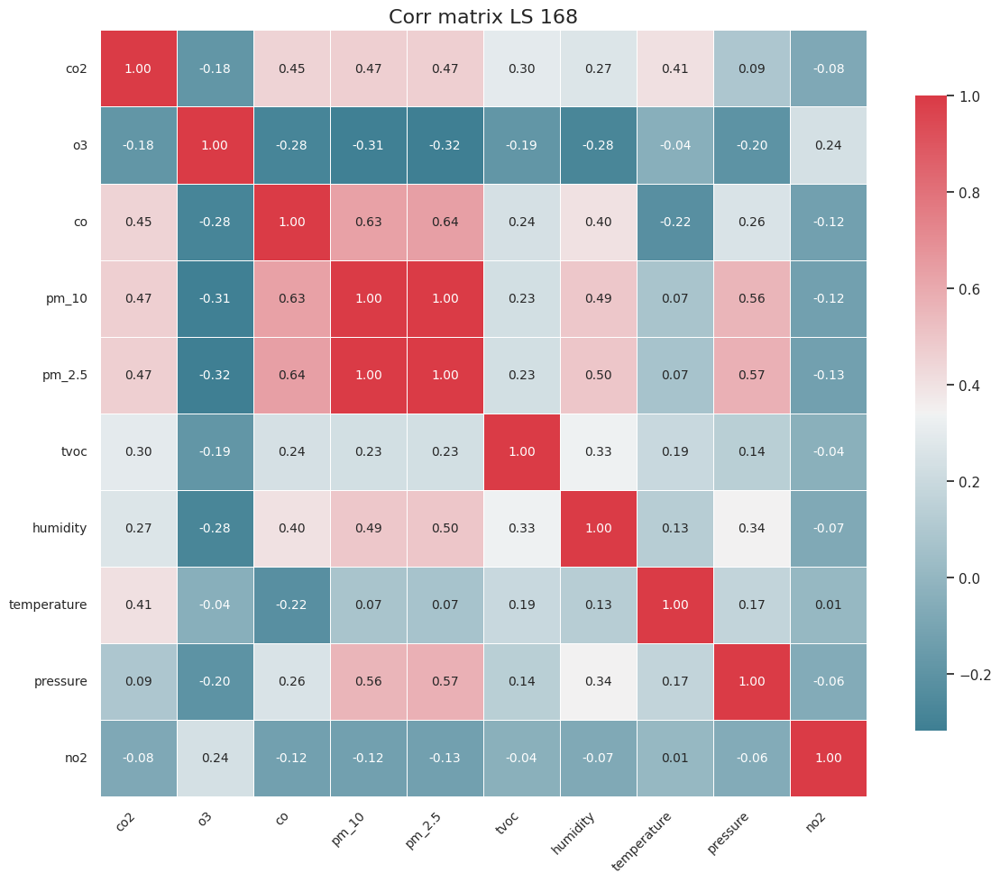

In [32]:
plot_correlation_matrix(df=df_168.corr(),title=f"Corr matrix LS 168")

## PAHs

### Time series plots

In [33]:
plot_experiment_range(df=df_168.resample('240s').mean(),col_names=['pm_10','pm_2.5'],max_value=110)


### Diff plot

In [34]:
plot_experiment_range(df=df_168.resample('240s').mean().diff(),col_names=['pm_10','pm_2.5'])

### diff percentage plot

In [35]:
plot_experiment_range(df=df_168.resample('240s').mean().pct_change() * 100,col_names=['pm_10','pm_2.5'],max_value=100)

/tmp/ipykernel_1906606/662724179.py:1: FutureWarning:

The default fill_method='pad' in DataFrame.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.



## O3 and NO2

### Time Series

In [36]:
plot_experiment_range(df=df_168.resample('240s').mean(),col_names=['o3','no2'])

### diff plot

In [37]:
plot_experiment_range(df=df_168.resample('240s').mean().pct_change() * 100,col_names=['o3','no2'],max_value=50)

/tmp/ipykernel_1906606/2302022652.py:1: FutureWarning:

The default fill_method='pad' in DataFrame.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.



## CO2 CO

### Time series

In [38]:
plot_experiment_range(df=df_168.resample('240s').mean(),col_names=['co2','co'],max_value=2000)

### diff plot

In [39]:
plot_experiment_range(df=df_168.resample('240s').mean().pct_change() * 100,col_names=['co2','co'],max_value=1000,min_value=-1000)

/tmp/ipykernel_1906606/3571822427.py:1: FutureWarning:

The default fill_method='pad' in DataFrame.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.



## Temperature and Humidity

### time series plot

In [40]:
plot_experiment_range(df=df_168.resample('240s').mean(),col_names=['temperature','humidity'])



## TVOC 

In [41]:
plot_experiment_range(df=df_168.resample('240s').mean(),col_names=['tvoc'])

## Overall analysis

In [46]:
diff_df = transform_diff_avg(df_168.resample('240s').mean())
diff_df.dropna(axis=1,inplace=True)
diff_df

/home/usr1_tt/collocation_study/notebooks/sensor/../../src/transform.py:15: FutureWarning:

The default fill_method='pad' in DataFrame.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.



,Doors opened,Hall opened,Indoor Room Air Exchange,Rowing CD,Rowing OD,Human Presence,Diffuser (Water),Diffuser (Oil),Car (3m),Car (5m),Gas Burner (CD),Gas Burner (OD),Candle
co2,0.343590,0.467996,0.505666,2.784107,-10.834159,0.326452,0.511432,0.409108,-0.132682,0.797701,1.429057,1.166621,0.589770
o3,-0.243229,-0.592010,-0.176658,-0.618314,-2.798852,0.536250,-0.645160,-0.165422,-1.572566,0.741578,-0.511835,-0.229294,-0.117423
co,4.932965,0.611597,3.831897,7.555619,-232.662625,-19.979055,12.004674,3.881492,3.525951,1.009494,16.073250,4.357058,2.128516
pm_10,0.273801,0.684458,0.949718,2.257642,-10.954062,4.679718,0.058562,0.020309,1.216699,-2.063572,1.259380,0.381123,-0.298566
pm_2.5,0.273801,0.666880,0.949723,2.264498,-10.840852,4.660791,0.152070,-0.141337,1.398931,-2.194373,1.259380,0.381123,-0.298874
tvoc,0.266525,0.262992,0.488426,0.767276,-3.948802,0.274136,0.220478,0.268934,0.588512,0.253340,2.890195,1.755368,1.034824
humidity,0.196460,0.106622,0.075138,0.087421,-3.937997,0.518722,0.279684,0.185259,0.282626,0.125613,0.586923,0.363063,0.304467
temperature,0.044565,0.017663,0.078400,0.346874,-0.073018,0.073051,0.052128,-0.033313,-0.033378,-0.032572,0.074222,-0.049567,-0.140013
pressure,0.001195,-0.001155,-0.000686,-0.003706,-0.001559,0.001040,0.002052,0.004180,0.005544,0.005007,-0.001102,0.000477,0.001417
no2,0.044433,-0.445794,-0.063015,0.225441,-5.954869,1.554107,-0.789148,0.828035,-2.080541,-1.212500,-0.164886,-0.349629,-0.165480


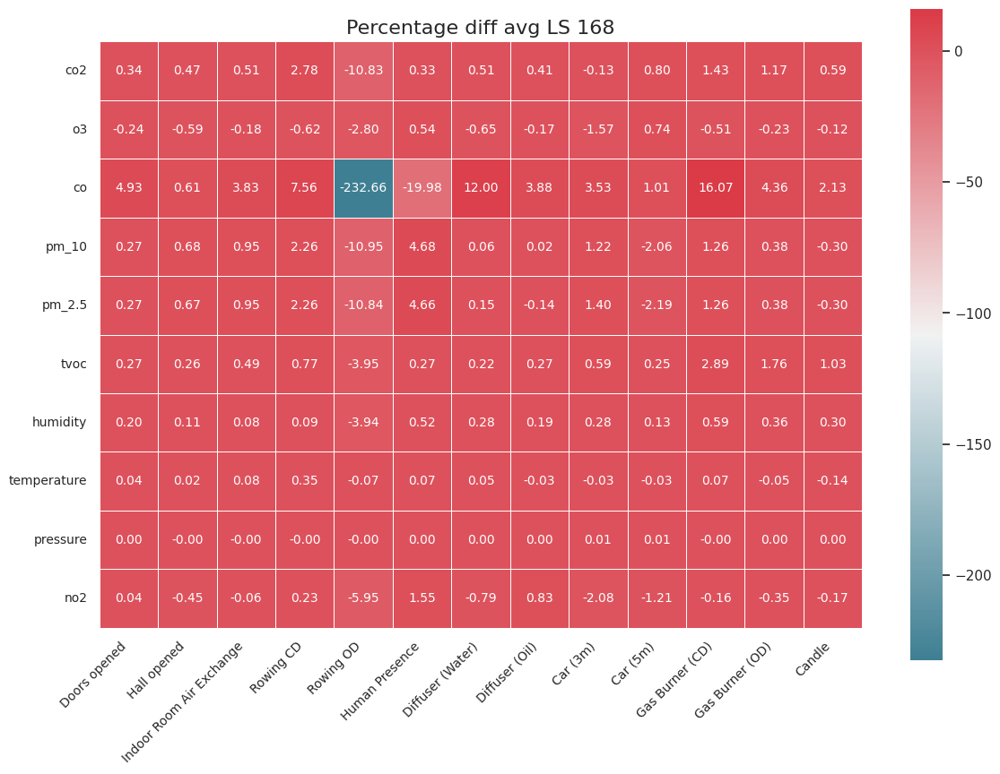

In [44]:
plot_correlation_matrix(diff_df,title="Percentage diff avg LS 168")

## Lag Analysis

/home/usr1_tt/collocation_study/notebooks/sensor/../../src/transform.py:15: FutureWarning:

The default fill_method='pad' in DataFrame.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.



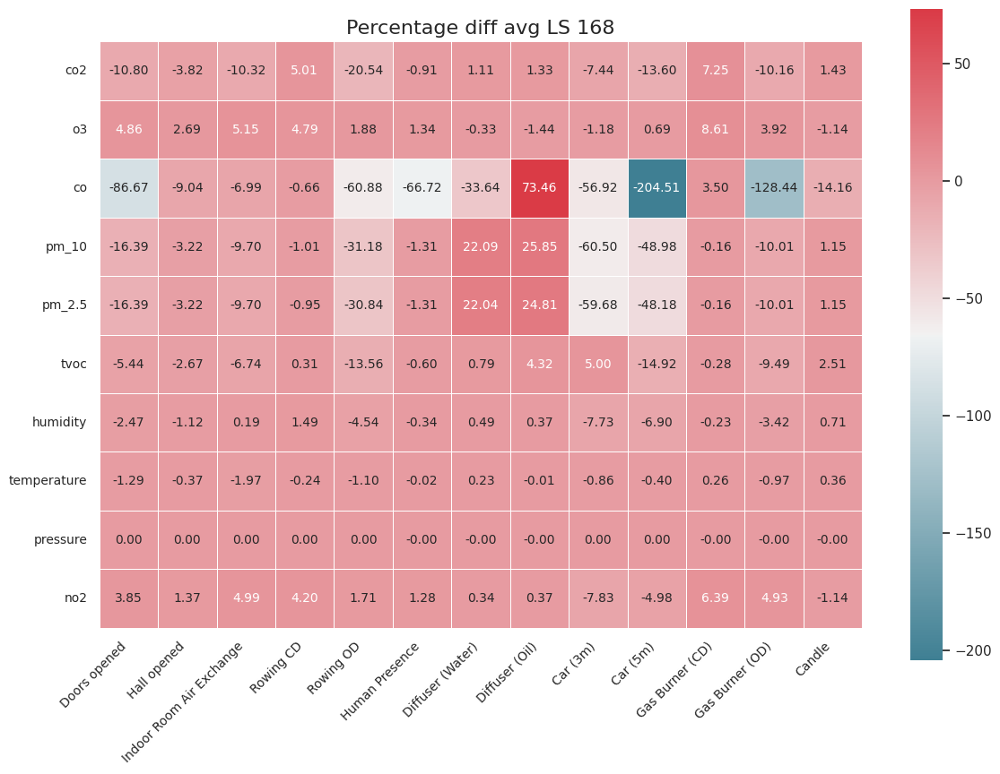

In [57]:
df_lag_168 = df_168.resample('240s').mean()
df_lag_168.index = df_lag_168.index + pd.Timedelta(minutes=120)
df_diff_lag = transform_diff_avg(df_lag_168)

plot_correlation_matrix(df_diff_lag,title="Percentage diff avg LS 168")

